# Brachistochrone problem

This explanation used coded adapted from prof. Marcel Sluiter from 03/01/2020

## Problem statement

### Introduction

<i>This problem is a little easier perhaps if you give a look at a slightly more complicated problem that was used as exercise in previous years, the Catenary problem.
The brachistochrone problem was posed more than 300 years ago by Johann Bernoulli.
When going from $A$ to $B$, under gravity and without there being any friction, what is the quickest path. So during the “fall” from $A$ to $B$ gravitational potential energy is converted to kinetic energy (and kinetic energy only). Now when $B$ is straight below $A$, the solution is trivial – simply a straight line down.
When $B$ is not straight below $A$, it gets more interesting because a straight line is no longer the quickest solution. Going straight down, and then continuing horizontally towards $B$ is not optimal either because it is a longer road one is traveling.
This problem was solved overnight by Newton – but that was Newton. We do it just as quick but with modern tools – computer programming!</i>

### Problem statement

Write a computer program that finds the quickest way from $A$ {coordinates $(0,1)$ horizontal at 0, height at 1} to $B$ {coordinates $(1,0)$ horizontal at 1, height at 0}. Assume that we have units such that the gravitational acceleration $g$ is $1$.

Find the path and the best time.

<div class="alert alert-block alert-info">
    In some reports, students have plotted several trajectories (straight line, quarter of a circle, cycloid etc.) and calculated the time of each trajectories. They concluded that the cycloid trajectory is the fastest. Despite that this is a correct answer, this is not the problem that was asked. We want to write a computer program that finds the quickest way from $A$ to $B$. The algorithm that you are writing should approximate the optimal line.
</div>

## Illustrated

In the figure below you can see the problem illustrated. A ball will roll from $A$ with coordinates $(0,1)$ to $B$ with coordinates $(1,0)$.

To alter the initial path of the ball, we slice the path into `nx` pieces. We want to alter the `yx`-coordinates of the pieces so that the total time it takes for the ball to roll to point $B$ is better than the straight line.

<div class="alert alert-block alert-info">
    Some students have proposed another approach. They started with <code>nx</code> line fragments and with every iteration (<code>for i in range(ix)</code>) change the entire line. This is not a very efficient way, as the iteration <code>ix+1</code> is not an improvement of iteration <code>ix</code>. This approach is a trial-and-error process that cost a lot of computational resources.
</div>

<div>
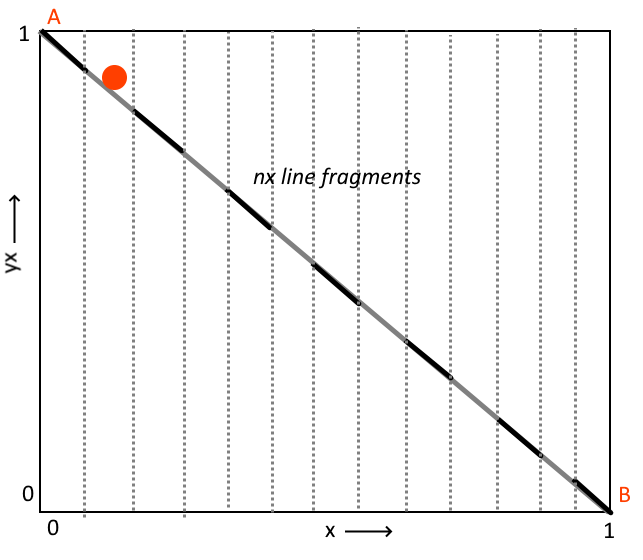
</div>

Let’s first write a function that inputs the current line and outputs the time it takes to travel the path:

## Function for time

To calculate the total time (`tt`) of the entire line, we calculate the time of each individual line fragment and sum those to get the total time. Let’s look at one of the `nx` line fragments:

<div>
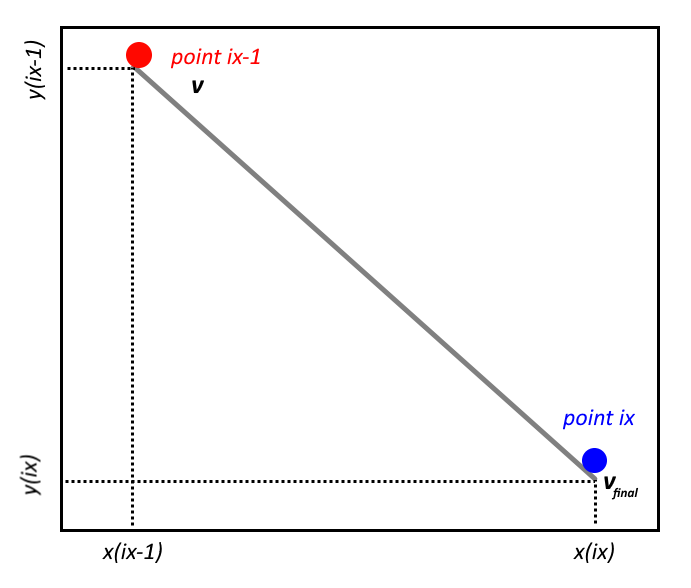
</div>

### Velocity at point `ix` ($v_{final}$)

The sum of the potential and kinetic energies at point `ix-1` and `ix` should be equal:

$$ \frac{1}{2}mv^{2} + mgh_{ix-1} = \frac{1}{2}mv_{final}^{2} + mgh_{ix}          $$

Here, $v$ is the velocity at the beginning of the line segment (`ix-1`), $v_{final}$ is the velocity at the end of the line segment (`ix`), $m$ is the mass of the ball, $g$ is the gravitational constant and $h$ is the height.

We can cancel out the masses in the equation and set $g=1$ (given in the problem description)

$$ \frac{1}{2}v^{2} + h_{ix-1} = \frac{1}{2}v_{final}^{2} + h_{ix}          $$

$$ \frac{1}{2}v^{2} + h_{ix-1} - h_{ix} = \frac{1}{2}v_{final}^{2}     $$

The expression $h_{ix-1} - h_{ix}$ is the difference in y coefficient of the two positions `dy`

$$ h_{ix} - h_{ix-1} = dy $$

We can further give an expresssion for $v_{final}$

$$ \frac{1}{2}v^{2} - dy = \frac{1}{2}v_{final}^{2} $$

$$ v^{2} - 2dy = v_{final}^{2} $$

$$ v_{final} = \sqrt{v^{2} - 2dy} $$

We say that the average velocity of the line fragment is 

$$ v_{average} = \frac{v + v_{final}}{2} $$


<div class="alert alert-block alert-info">
Some students have taken $v_{final}$ as the velocity of the entire linefragment ($v_{average} = \sqrt{v^{2}-2dy)}$. This is not true, as this is the velocity of the ball at point <code>ix</code>. By doing this, you are overestimating the velocity of the line and will have a initial time for a straight line of approximately $t_{initial}=1.55$ instead of $t_{initial}=2.0$.
</div>

### Time of a line fragment

The time of the line fragment can therefore be calculated with

$$ t = \frac{d}{v_{average}} $$

Where distance $d$ is found using Pythagoras theorem:

$$ d = \sqrt{dx^{2} + dy^{2}} $$

Subsequently, we calculate the time of a line fragment `dt`, add `dt` to the total time `tt`, replace `v` with `vfinal` and move on to the next linefragment `ix+1`.

In [1]:
from __future__ import division
from numpy import zeros, r_
from pylab import figure, plot, show, close, subplot, xlabel, ylabel, title,xlim, ylim, clf, pause, tight_layout
from cmath import sqrt as csqrt
from math import sqrt
import random,sys,copy
from matplotlib import pyplot as plt
import imageio

%matplotlib inline

In [2]:
def time(x,yx,nx):
    """
    time to desc using path yx
    """
    tt=0    #total time of the path, initalised as 0
    v=0     #velocity of the start of a line segment, initalised as 0
    g=1     #gravitional acceleration
    
    for ix in range(1,nx):                  #loop over every end of a linefragment
        dx = x[ix]-x[ix-1]                  #x coordinate difference end-beginning
        dy = yx[ix]-yx[ix-1]                #y coordinate difference end-beginning
        vfinal = csqrt( v*v-2*g*dy ).real   #calculate the velocity at the end of the line fragment
        vaverage = (v+vfinal)/2.0           #average velocity of beginning and end
        distance = sqrt( dx*dx + dy*dy)     #distance of line fragment (Pythagoras)
        dt = distance/vaverage              #time it takes to travel the line fragment
        v = vfinal                          #end velocity of line fragment i becomes velocity of fragment i+1
        tt = tt + dt                        #add fragment time to total time
    return tt

## Change the y coordinate of the line fragment

Now that we know how to calculate the travel time with the input of line fragment `x` and `yx` coordinates, we try to update the `yx`-coordinate of a randomly chosen line fragment. If the total time of the new trajectory is better, it will be used as the previously best trajectory. The following steps will guide you through the reasoning:

### Make a straight line `yx` as initial guess

Note: $D$ and $L$ are the horizontal and vertical length of the line and set as $1$.

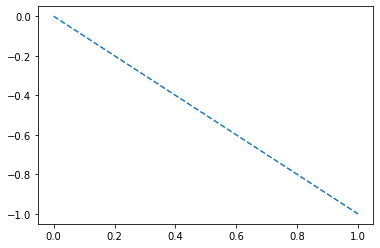

In [3]:
L = 1 
D = 1
nx = 10

filename="tpm_frame.png"
ntriespersite = 1000000
ntries = ntriespersite*nx
nframes=3000

TT = zeros(ntries,float)  #total time
yx = zeros(nx,float)   #path described as a series of consecutive straight lines
yt = zeros(nx,float)   #trial path described as a series of consecutive straight lines
yxstart = zeros(nx,float)   #trial path described as a series of consecutive straight lines
x = r_[0:L*1.0001:L/(nx-1)]
#~ print(x)
for ix in range(1,nx):
   yx[ix] = -(D/L)*x[ix] #straight line AB

yxstart[:] = yx[:]

plot(x,yxstart, '--')

### Calculate the time `TTstart` of the straight line

In [4]:
TTstart = time(x,yxstart,nx)
#~ TTstart = 2
print('T_initial: '+str(TTstart))
TT[0]=TTstart

T_initial: 2.0


### Set the straight line as the previously best time `TTprev`

In [5]:
TTprev = TTstart

We plot the initial state of the total line

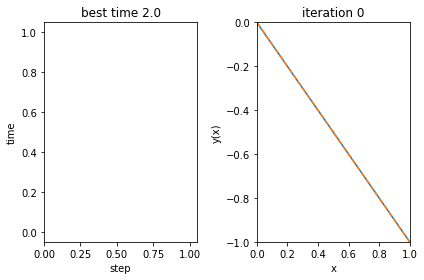

In [6]:
iframe = 0
figure(1)
subplot(121)
plot(TT[1:1])
xlabel('step')
ylabel('time')
xlim(xmin=0)
title("best time " + str(TTprev))
subplot(122)
plot(x, yx)
plot(x, yxstart, '--')
xlim(0, L)
ylim(-D, 0)
xlabel('x')
ylabel('y(x)')
title("iteration " + str(iframe))
tight_layout()
show()

We initialize the variables that account for the number of succesfull changes and the maximum change of the linefragment

In [7]:
success=0
maxchange=D/5.0

### Randomly choose a line fragment `ip` to alter

Randomly choose a line fragmetn to alter

`ip = random.randint(1, nx-2) #first and last point are fixed!` 

<div class="alert alert-block alert-info">
    You will be altering the <u>end</u> of a line fragment, therefore make sure that point <code>nx</code> cannot be chosen (because <code>nx+1</code> is outside the range of the line.
In addition, you want point $A$ and $B$ to be fixed. Therefore, make sure that your loop skips the first point and doesn’t include the last point. That’s why ip is from <code>(1, nx-2)</code>.
</div>

### Change the `yx` coordinate of line fragment `ip`

```
changey = (random.random()-0.5)*maxchange
yt[:] = yx[:]
yt[ip]=yt[ip]+changey
```

### Calculate the time `TTtry` of the altered line

`TTtry = time(x,yt,nx)`

### Check if the altered time `TTtry` is better than the previous best time `TTprev`

```
if(TTtry < TTprev):
    success=success+1
    yx[:] = yt[:]
    TTprev = TTtry
```

### Run these steps for `ntries`
```
    for it1 in range(int(ntries/100)):
        for it2 in range(100):
```

The final code incorporates a module that writes a .gif. It also cuts the amount of iterations in chunks of 100. After each 100 iterations, it decides by the number of succesfull iterations (`success`) if the value of `maxchange` is increased or decreased

In [8]:
with imageio.get_writer('movie.gif', mode='I') as writer:
    for it1 in range(int(ntries/100)):
        for it2 in range(100):
            #point (2 - nx-1) to be modified (points A and B are fixed)
            ip = random.randint(1, nx-2)
            changey = (random.random()-0.5)*maxchange
            yt[:] = yx[:]
            yt[ip]=yt[ip]+changey
            TTtry = time(x,yt,nx)
            if(TTtry < TTprev):
                success=success+1
                yx[:] = yt[:]
                TTprev = TTtry
                iframe=iframe+1
                TT[iframe] = TTtry
                if(iframe < nframes+1):    # Convert the figure to a video frame. 
                    ### CODE FOR PLOTTING
                    pass
                    
        if success < 10:
            maxchange = maxchange/2
            print('maxchange:'+str(maxchange))
        else:
            if success > 70:
                maxchange = maxchange*1.5
                print('maxchange:'+str(maxchange))
      
    
        if maxchange < 0.001*D:
            print(['best time:',str(TTprev),'   number of iframes needed:',str(iframe)])
            writer.close()
            break #return
    
        success=0   
    
    print(['best time:',str(TTprev),'   number of iframes needed:',str(iframe)])
    writer.close()

maxchange:0.1
maxchange:0.05
maxchange:0.025
maxchange:0.0125
maxchange:0.00625
maxchange:0.003125
maxchange:0.0015625
maxchange:0.00078125
['best time:', '1.8383812097883077', '   number of iframes needed:', '309']
['best time:', '1.8383812097883077', '   number of iframes needed:', '309']


## Plotting

The following figure displays a plot of the previous best time as function of the iteration on the left and the dashed initial straight path and the optimized path after around 300 iterations.

<div class="alert alert-block alert-info">
Make sure that your run the simulation for a significant amount of iterations (around 300) so that the system can converge to an optimal configuration.
</div>

The best time should be around $t = 1.839$.

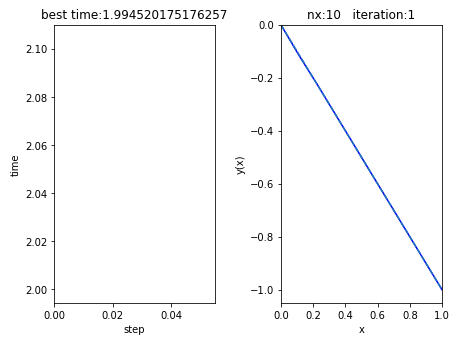